In [1]:
import os
import json
import time
import copy
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import random
from torch.utils.data import Dataset
from torchvision import transforms
import torchvision
import torch
import numpy as np
from tqdm.notebook import tqdm
from collections import defaultdict
from sklearn.metrics import roc_curve, auc
import warnings
warnings.filterwarnings('ignore')

In [2]:
torch.cuda.is_available()

True

In [3]:
dataset_folder = "./../../datasets/ball_pythons/"

In [4]:
main_folder_list = os.listdir(dataset_folder)
morph_folder_list = [f"{dataset_folder}{i}/" for i in main_folder_list if "%" not in i and "." not in i and "Pos" not in i]

In [5]:
morph_img_folder_dict = {}
for morph_folder in morph_folder_list:
    morph_img_folder_list = os.listdir(morph_folder)
    morph_img_folder_list = [f"{morph_folder}{i}/" for i in morph_img_folder_list]
    if len(morph_img_folder_list) > 50:
        morph_img_folder_dict[morph_folder.split("/")[-2]] = {"img_folders": morph_img_folder_list,
        "num_imgs": len(morph_img_folder_list)}

total imgs in dict: 11277 - 15 morphs


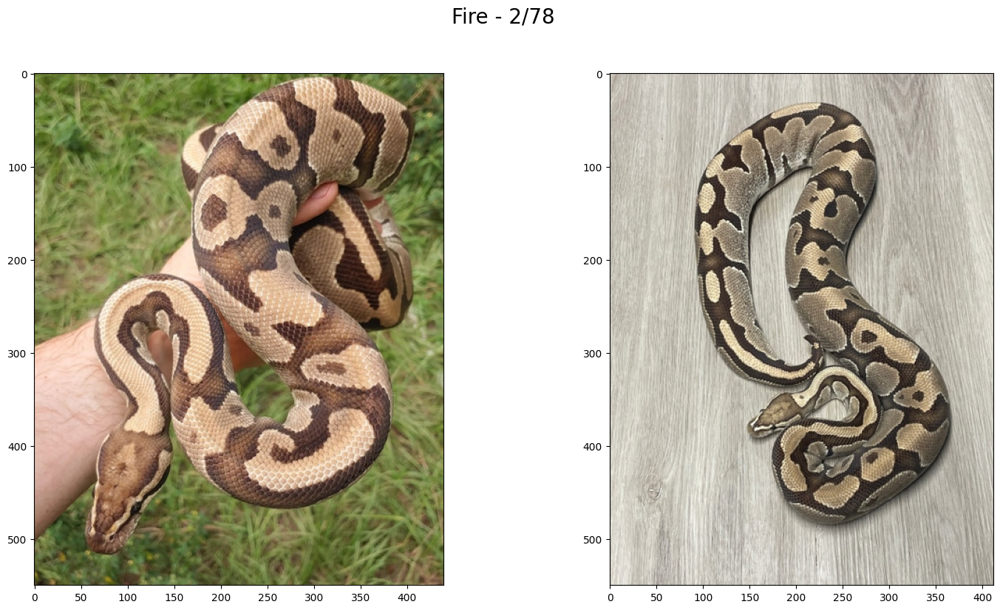

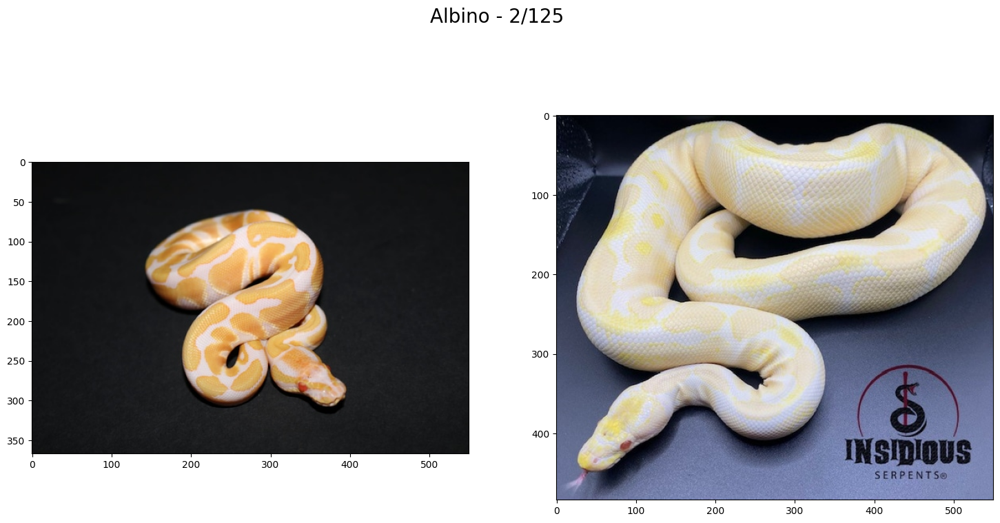

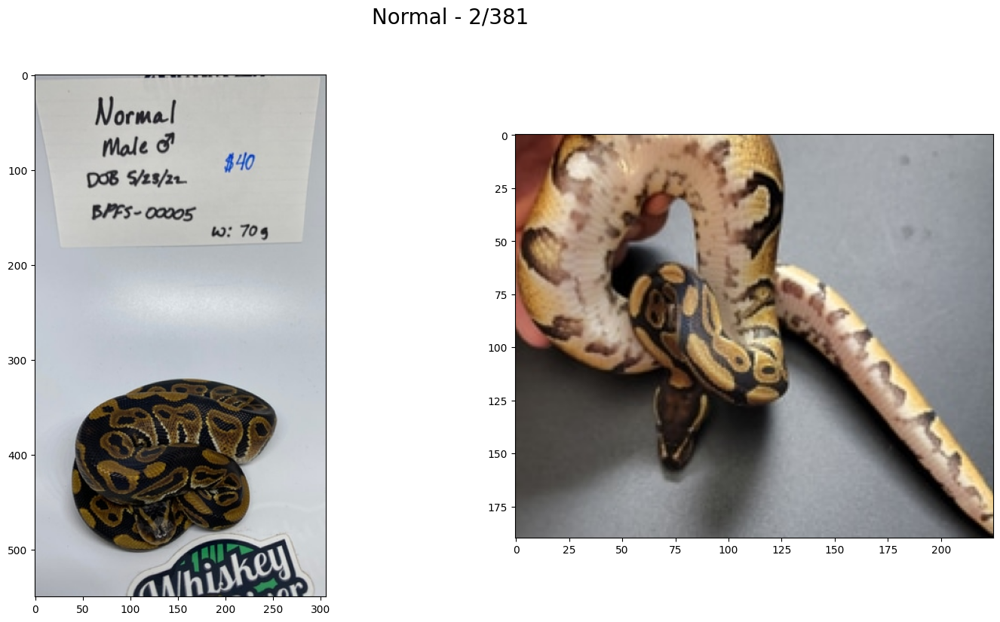

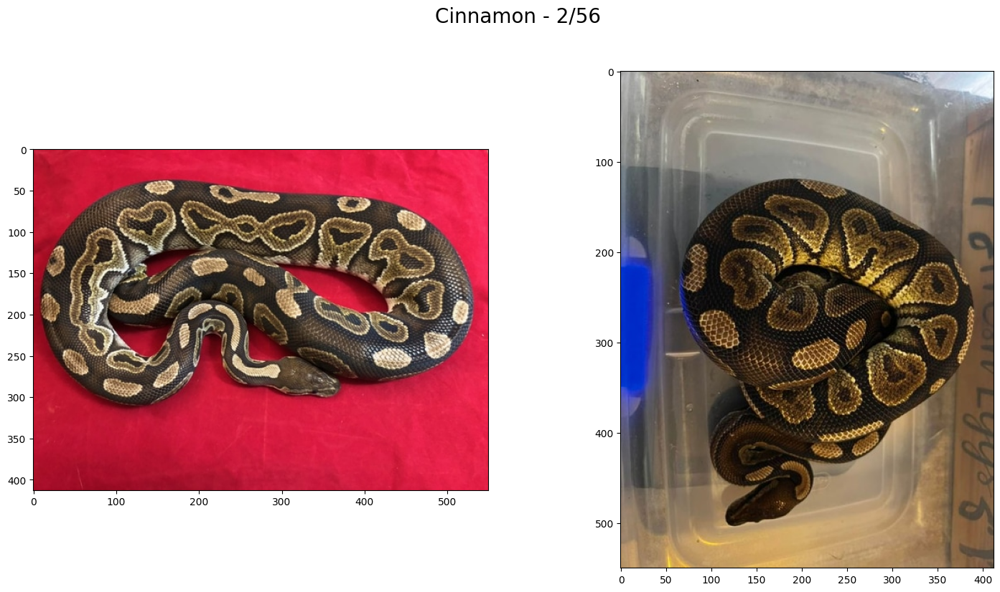

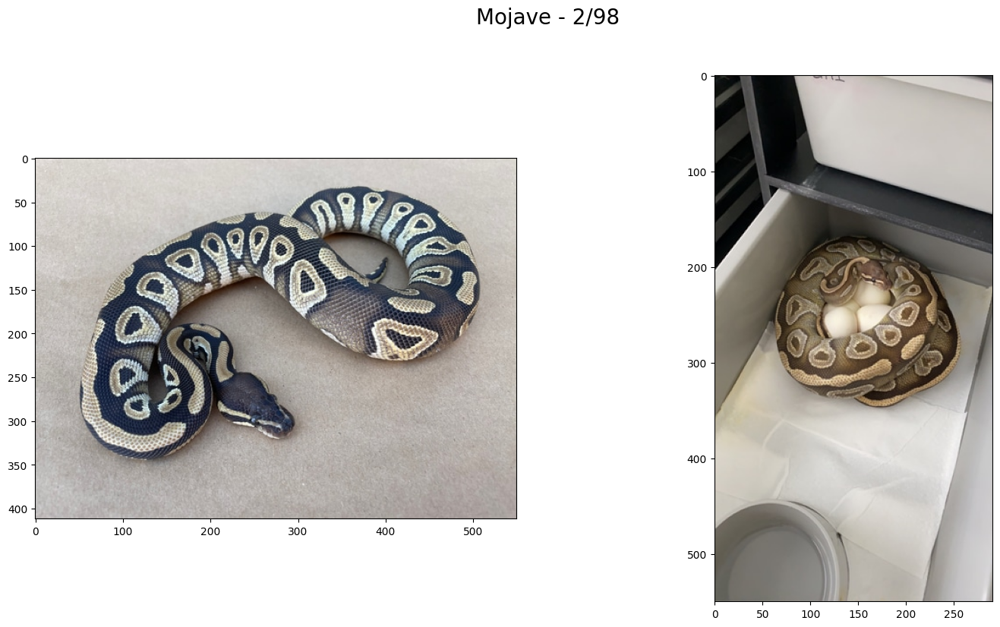

...

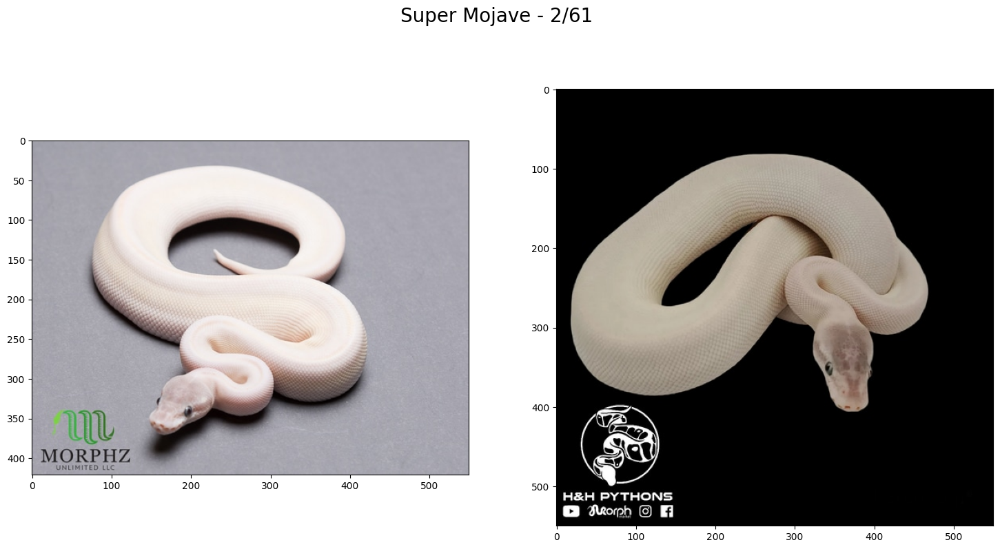

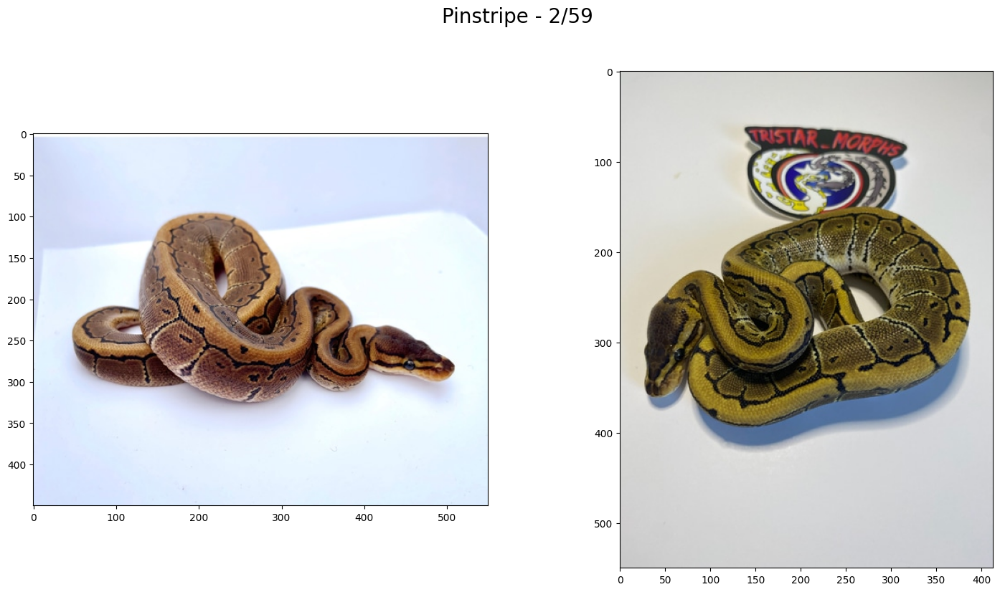

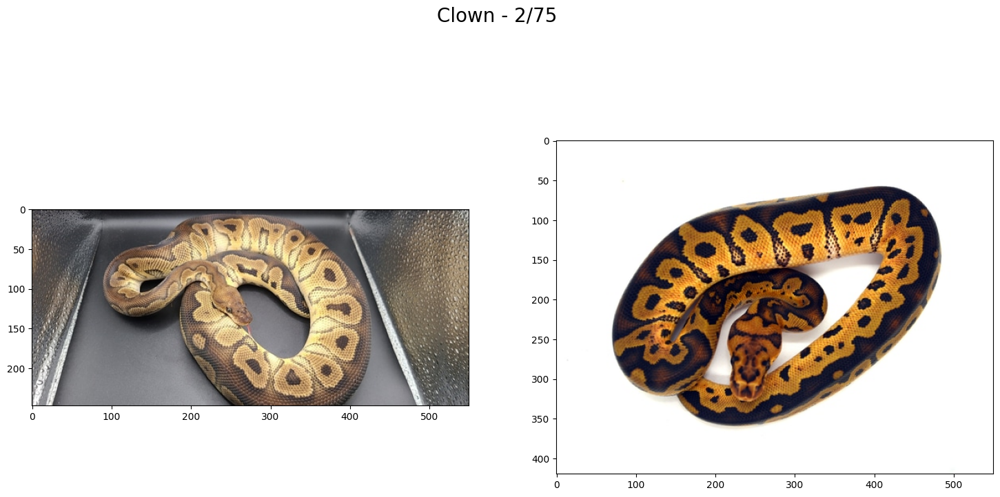

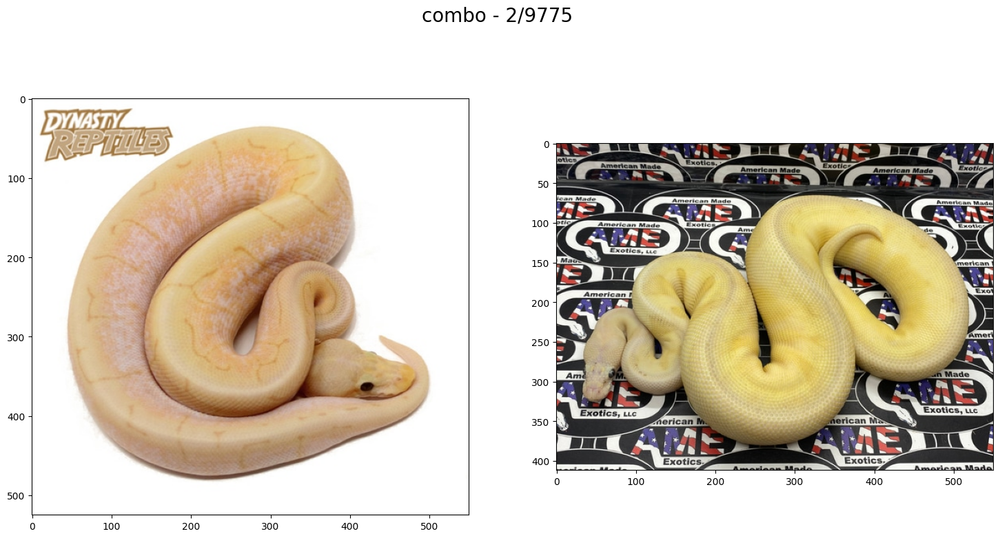

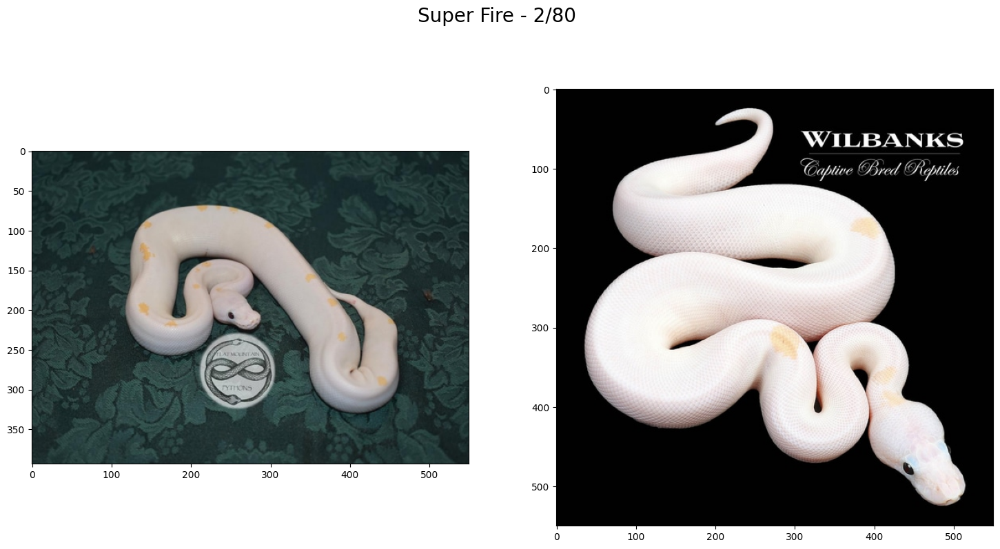

In [6]:
%matplotlib inline
total = 0
json_paths_list = []
for morph, morph_dict in morph_img_folder_dict.items():
    img_folder_list = morph_dict["img_folders"]
    image_paths = [[i+k for k in os.listdir(i) if k.endswith(".png")][0] for i in img_folder_list]
    json_paths = [[i+k for k in os.listdir(i) if k.endswith(".json")][0] for i in img_folder_list]
    json_paths_list.extend(json_paths)
    rand_samples = random.sample(image_paths,2)
    fig, ax = plt.subplots(ncols=2, figsize=(18,9))
    image = Image.open(rand_samples[0])
    ax[0].imshow(image)
    image = Image.open(rand_samples[1])
    ax[1].imshow(image)
    fig.suptitle(f"{morph} - 2/{morph_dict['num_imgs']}", fontsize=20)
    total += morph_dict["num_imgs"]
print(f"total imgs in dict: {total} - {len(morph_img_folder_dict)} morphs")

In [7]:
morph_details_dict = {}
all_image_details_dict = {}
for path in tqdm(json_paths_list):
    image_details_dict = {}
    cur_morph = path.split("/")[-3]
    if not morph_details_dict.get(cur_morph):
        morph_details_dict[cur_morph] = {}
    with open(path, "r") as f:
        image_details_dict = json.load(f)
        del image_details_dict["raw_details"]
    early_path = "/".join(path.split("/")[:-1])
    image_path = [f"{early_path}/{i}" for i in os.listdir(early_path) if not i.endswith(".json")][0]
    try:
        image = Image.open(image_path)
        image_details_dict["width"] = image.width
        image_details_dict["height"] = image.height
    except Exception as e:
        image_details_dict = {}
    if image_details_dict:
        morph_details_dict[cur_morph][image_path] = image_details_dict
        all_image_details_dict[image_path] = image_details_dict

  0%|          | 0/11277 [00:00<?, ?it/s]

In [8]:
metadata_df = pd.DataFrame.from_dict(all_image_details_dict, orient="index")
metadata_df = metadata_df.reset_index()
metadata_df = metadata_df.rename(columns={"index":"image_path"})

In [9]:
metadata_df.head()

,image_path,sex,traits,weight,price,width,height,dob,proven_breeder
0,./../../datasets/ball_pythons/Fire/Fire_bb1b7d...,female,[Fire],200g,US$125.00,550,540,NaN,NaN
1,./../../datasets/ball_pythons/Fire/Fire_fa9ffb...,male,[Fire],760g,US$100.00,412,550,2019,NaN
2,./../../datasets/ball_pythons/Fire/Fire_6703a0...,female,[Fire],1900g,US$500.00,412,550,July 2019,Yes
3,./../../datasets/ball_pythons/Fire/Fire_bf00f4...,female,[Fire],1644g,US$375.00,440,550,2016,Yes
4,./../../datasets/ball_pythons/Fire/Fire_b1ca68...,female,[Fire],NaN,US$85.00,550,413,2021,NaN


In [10]:
metadata_df.to_csv("./../../datasets/ball_pythons/dataset_metadata.csv", index=False)

In [11]:
test_df = pd.read_csv("./../../datasets/ball_pythons/dataset_metadata.csv")
test_df.head()

,image_path,sex,traits,weight,price,width,height,dob,proven_breeder
0,./../../datasets/ball_pythons/Fire/Fire_bb1b7d...,female,['Fire'],200g,US$125.00,550,540,NaN,NaN
1,./../../datasets/ball_pythons/Fire/Fire_fa9ffb...,male,['Fire'],760g,US$100.00,412,550,2019,NaN
2,./../../datasets/ball_pythons/Fire/Fire_6703a0...,female,['Fire'],1900g,US$500.00,412,550,July 2019,Yes
3,./../../datasets/ball_pythons/Fire/Fire_bf00f4...,female,['Fire'],1644g,US$375.00,440,550,2016,Yes
4,./../../datasets/ball_pythons/Fire/Fire_b1ca68...,female,['Fire'],NaN,US$85.00,550,413,2021,NaN


In [12]:
print(f"width - min: {metadata_df.width.min()} - median: {metadata_df.width.median()} - max: {metadata_df.width.max()}")
print(f"height - min: {metadata_df.height.min()} - median: {metadata_df.height.median()} - max: {metadata_df.height.max()}")

width - min: 155 - median: 550.0 - max: 550
height - min: 158 - median: 452.0 - max: 550


In [13]:
trait_list = []
for trait in metadata_df.traits.to_list():
    trait_list.extend(trait)

In [14]:
traits_dict = defaultdict(lambda: 0)
for trait in trait_list:
    traits_dict[trait] += 1

In [15]:
traits_dict = {k: v for k, v in sorted(traits_dict.items(), key=lambda item: item[1])}
traits_dict

{'Monarch': 1,
 '50% Het Moray': 1,
 'Smoke': 1,
 'Ajax': 1,
 'Alloy': 1,
 'Citron': 1,
 'Super Calico': 1,
 'Zuwadi': 1,
 '66% Het Monsoon': 1,
 'Mosaic': 1,
 '66% Het Orange Ghost': 1,
 'Black Belly': 1,
 'Super Phantom': 1,
 'Pos Het Caramel Albino': 1,
 'Super Bamboo': 1,
 'Super Spark': 1,
 '100% Het Axanthic (MJ)': 1,
 'Melt': 1,
 'Bling Yellow Belly': 1,
 'Super Nr Mandarin': 1,
 'Arcane': 1,
 'Axanthic (MJ)': 1,
 'Pos Het Moray': 1,
 'Marvel': 1,
 'Super Bongo': 1,
 'Satin': 1,
 'Super X-treme Gene': 1,
 '100% Het Axanthic (GCR)': 1,
 'KRG': 1,
 'Pastel Jungle': 1,
 'Jolt': 1,
 'Nyala': 1,
 'Cafe': 1,
 'Desert': 1,
 '100% Het Ghost (Vesper)': 1,
 'Super Scaleless Head': 1,
 '100% Het Green Ghost': 1,
 'Java': 1,
 'Paint': 1,
 'Super Cypress': 1,
 'Super Disco': 1,
 'Flare': 1,
 'Super Sapphire': 1,
 'Super Black': 1,
 'Lori': 1,
 'Super Asphalt': 2,
 'Super Sandblast': 2,
 '50% Het Monsoon': 2,
 'Pos Het Ghost (Vesper)': 2,
 '66% Het Tri-stripe': 2,
 'Super Red Stripe': 2,
 'Hy

In [16]:
filtered_traits = []
for trait, num in traits_dict.items():
    if '%' in trait and "100" not in trait:
        continue
    elif num >= 20:
        filtered_traits.append(trait)

In [17]:
class SquareCrop(object):
    def __init__(self):
        pass

    def __call__(self, tensor):
        longer_side = min(tensor.size)
        horizontal_padding = (longer_side - tensor.size[0]) / 2
        vertical_padding = (longer_side - tensor.size[1]) / 2
        cropped_tensor = tensor.crop((-horizontal_padding,
                        -vertical_padding,
                        tensor.size[0] + horizontal_padding,
                        tensor.size[1] + vertical_padding
                ))
        return cropped_tensor
    
    def __repr__(self):
        return self.__class__.__name__+'()'

In [18]:
def get_split(sample_array, split):
    np.random.seed(0)
    np.random.shuffle(sample_array)
    np.random.seed()
    if split == 'train':
        sample_array = sample_array[:int(len(sample_array)*0.7)]
    elif split == 'val':
        sample_array = sample_array[int(len(sample_array)*0.7):int(len(sample_array)*0.85)]
    elif split == 'test':
        sample_array = sample_array[int(len(sample_array)*0.85):]
    return list(sample_array)

In [19]:
def count_number_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [20]:
unique_traits = list(set(filtered_traits))
col_names = ["image_path"]
col_names.extend(unique_traits)
label_df = pd.DataFrame(columns=col_names)
# label_df = label_df.set_index("image_path")

In [21]:
label_df.head()

,image_path,Calico,Axanthic (VPI),Enchi,100% Het Puzzle,100% Het Genetic Stripe,Super Fire,Mahogany,Super Orange Dream,Trick,...,100% Het Axanthic (VPI),Stranger,100% Het Desert Ghost,100% Het Cryptic,Sandblast,Het Red Axanthic,Special,Banana,Cypress,Lucifer


In [22]:
# for ind, row in tqdm(metadata_df.iterrows(), total=len(metadata_df)):
#     label_row = [row['image_path']]
#     label_row.extend([1 if i in row['traits'] else 0 for i in unique_traits])
#     label_df.loc[len(label_df.index)] = label_row
# label_df.to_csv("./../../datasets/ball_pythons/label_data_filt_15_no_poss.csv", index=False)
label_df = pd.read_csv("./../../datasets/ball_pythons/label_data_filt_15_no_poss.csv")

In [23]:
label_df.sample(5)

,image_path,100% Het Hypo,Female Maker,Cinnamon,Special,100% Het Clown,Gravel,Sandblast,100% Het Puzzle,Red Stripe,...,Super Yellow Belly,Spotnose,Axanthic (TSK),100% Het Ultramel,Calico,Pastel,Super Banana,Trick,Orange Dream,Super Pastel
408,./../../datasets/ball_pythons/Normal/Normal_c0...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5698,./../../datasets/ball_pythons/combo/combo_b1b7...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2245,./../../datasets/ball_pythons/combo/combo_6db7...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3205,./../../datasets/ball_pythons/combo/combo_7b20...,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7138,./../../datasets/ball_pythons/combo/combo_6968...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [24]:
class BallPythonDataset(Dataset):
    ##### Initialize the class #####
    def __init__(self, dataset_df, possible_traits, split = 'train'):
        ## Split parameter is used to specify which process the data is used for,
        ## and it can be 'train', 'val', and 'test
        
        self.set_of_finding_labels = possible_traits
        
        ## Get the list of all patient ids present in the dataset and split into
        ## training, validation and testing by patient id, but not by list of examples
        image_paths = pd.unique(dataset_df.index)
        selected_paths = get_split(image_paths, split)

        sample_df = dataset_df.loc[selected_paths]      
        
        sample_df = sample_df[["image_path"] + self.set_of_finding_labels]

        self.image_list = sample_df['image_path'].values
        self.targets = sample_df[self.set_of_finding_labels].values
        
        ## Define data augmentation transformations for the input images. In this exercise, we use the following
        ## transformations: square center cropping, resizing to 224x224 (to be similar as ImageNet dataset), 
        ## converting to tensor, normalizing per channel (i.e., R, G, and B) 
        ## with the average and standard deviation of images in the ImageNet dataset        
        self.set_of_transforms = transforms.Compose(
        [SquareCrop(),
         transforms.Resize(228),
         transforms.ToTensor(), 
         transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                 std=[0.5, 0.5, 0.5]),
        transforms.Resize(224)])
        
    ##### Retrieve a sample with the corresponding index #####
    ## This function retrieve a sample from the dataset at the specified index 
    ## and returns an image and the corresponding label stored in Pytorch tensors     
    def __getitem__(self, index):
        curr_pil_image = Image.open(self.image_list[index])
        image_to_return = self.set_of_transforms(curr_pil_image)
                
        return image_to_return, torch.FloatTensor(self.targets[index])
    
    ##### Get the length of the dataset #####tm
    def __len__(self):
        return len(self.image_list)
    
    ##### Access the name of conditions in the labels #####
    def get_labels_name(self):
        return self.set_of_finding_labels

In [25]:
train_dataset = BallPythonDataset(label_df, unique_traits)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

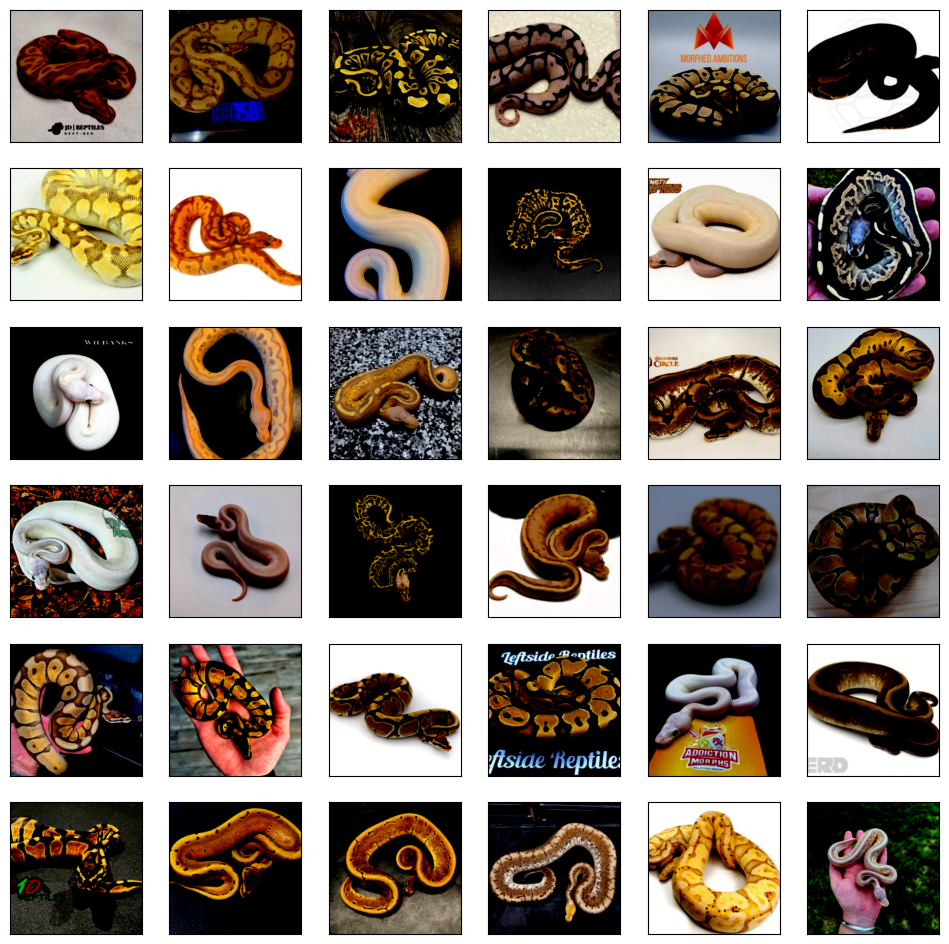

In [26]:
fig, ax = plt.subplots(ncols = 6, nrows = 6, figsize=(12,12))
j = 0
for i, rand_ind in enumerate(random.sample(list(range(len(train_dataset))), 36)):
    k = i % 6
    img, targ = train_dataset[rand_ind]
    ax[j,k].imshow(img.permute(1,2,0).detach())
    ax[j,k].set_xticks([])
    ax[j,k].set_yticks([])
    if k == 5:
        j += 1

In [27]:
trait_freq = np.sum(train_dataset.targets, axis=0)/len((train_dataset))
for i, trait_name in enumerate(unique_traits):
    print(f"{trait_name} - {round(trait_freq[i]*100, 4)}%")

Calico - 1.3702%
Axanthic (VPI) - 3.0322%
Enchi - 11.4311%
100% Het Puzzle - 0.609%
100% Het Genetic Stripe - 0.7232%
Super Fire - 0.9262%
Mahogany - 2.5628%
Super Orange Dream - 0.1903%
Trick - 0.3299%
Mystic - 0.6724%
100% Het Axanthic (TSK) - 2.474%
Spider - 5.798%
Super Yellow Belly - 0.5202%
Phantom - 0.647%
Orange Dream - 5.189%
Wookie - 0.3552%
Blade - 0.3806%
Pos Het Albino - 0.203%
Genetic Stripe - 0.812%
Spotnose - 2.474%
Lavender Albino - 0.5455%
Black Pastel - 6.6861%
Female Maker - 0.1776%
Vanilla - 1.9158%
100% Het Clown - 11.4438%
100% Het Ultramel - 0.7612%
Pos Het Piebald - 0.6978%
Pinstripe - 8.3481%
Fader - 0.1269%
Chocolate - 1.2307%
Black Head - 1.7508%
Desert Ghost - 1.256%
Bamboo - 5.8741%
Disco - 0.2157%
Super GHI - 0.3933%
100% Het Albino - 2.9434%
Red Stripe - 0.9896%
Bongo - 0.406%
Hypo - 3.6666%
Confusion - 0.5202%
GHI - 6.7496%
100% Het Tri-stripe - 0.2411%
Super Cinnamon - 0.2537%
Red Gene - 0.1903%
100% Het Orange Ghost - 0.2411%
Clown - 7.9295%
Gravel - 

In [28]:
##### Request a GPU #####
## This function locates an available gpu for usage. In addition, this function reserves a specificed
## memory space exclusively for your account. The memory reservation prevents the decrement in computational
## speed when other users try to allocate memory on the same gpu in the shared systems, i.e., CADE machines. 
## Note: If you use your own system which has a GPU with less than 4GB of memory, remember to change the 
## specified mimimum memory.

# def define_gpu_to_use(minimum_memory_mb = 8000):    
#     thres_memory = 600 #
#     gpu_to_use = None
#     try: 
#         os.environ['CUDA_VISIBLE_DEVICES']
#         print('GPU already assigned before: ' + str(os.environ['CUDA_VISIBLE_DEVICES']))
#         return
#     except:
#         pass
    
#     torch.cuda.empty_cache()
#     for i in range(16):
#         free_memory = !nvidia-smi --query-gpu=memory.free -i $i --format=csv,nounits,noheader
#         if free_memory[0] == 'No devices were found':
#             break
#         free_memory = int(free_memory[0])
        
#         if free_memory>minimum_memory_mb-thres_memory:
#             gpu_to_use = i
#             break
            
#     if gpu_to_use is None:
#         print('Could not find any GPU available with the required free memory of ' + str(minimum_memory_mb) \
#               + 'MB. Please use a different system for this assignment.')
#     else:
#         os.environ['CUDA_VISIBLE_DEVICES'] = str(gpu_to_use)
#         print('Chosen GPU: ' + str(gpu_to_use) + f" with {free_memory}MB free")
#         x = torch.rand((256,1024,minimum_memory_mb-thres_memory)).cuda()
#         x = torch.rand((1,1)).cuda()        
#         del x
        
# ## Request a gpu and reserve the memory space
# define_gpu_to_use()

In [29]:
##### Calculate AUC metric #####
## This function compute AUC from the given input arrays i.e., predicted value and ground truth arrays
def auroc(logits_predicted, target):
    fpr, tpr, _ = roc_curve(target, logits_predicted)
    return auc(fpr, tpr)

##### Compute AUC of a given dataset #####
## This function takes a model and Pytorch data loader as input. 
## The given model is used to predict the expected label for each sample in the Pytorch data loader.
def get_score_model_auroc(model, data_loader):
    ## Toggle model to eval mode
    model.eval()
    
    ## Iterate through the dataset and perform inference for each sample.
    ## Store inference results and target labels for AUC computation 
    with torch.no_grad():
        
        logits_predicted = np.zeros([1, len(unique_traits)])
        targets = np.zeros([1, len(unique_traits)])
        ## Iterate through the dataset and perform inference for each sample.
        ## Store inference results and target labels for AUC computation  
        for image, target in data_loader:
            image = image.cuda()
            # image = image.unsqueeze(0)
            logit_predicted = model(image)
            logits_predicted = np.concatenate((logits_predicted, logit_predicted.cpu().detach().numpy())\
                                              , axis = 0)
            # target = target.unsqueeze(0)
            targets = np.concatenate((targets, target.cpu().detach().numpy()), axis = 0)
            
    ## Return a list of auc values in which each value corresponds to one of the traits
    return [auroc(logits_predicted[:,i], targets[:,i]) for i in range(len(unique_traits))]

In [30]:
train_dataset = BallPythonDataset(label_df, unique_traits, 'train')
val_dataset = BallPythonDataset(label_df, unique_traits, 'val')
test_dataset = BallPythonDataset(label_df, unique_traits, 'test')

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=24, num_workers=12)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=24, num_workers=12)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=24, num_workers=12)

In [31]:
resnet18_default_weights = torchvision.models.ResNet18_Weights.DEFAULT
resnet18_pretrain = torchvision.models.resnet18(weights=resnet18_default_weights, progress=False)
print("### resnet18 ###")
print(count_number_parameters(resnet18_pretrain))
# print(resnet18_pretrain)

resnet18_finetune = resnet18_pretrain
num_ftrs = resnet18_finetune.fc.in_features
resnet18_finetune.fc = torch.nn.Linear(num_ftrs, len(unique_traits))
print("### modified resnet18 ###")
print(count_number_parameters(resnet18_finetune))
resnet18_finetune = resnet18_finetune.cuda()
# print(resnet18_finetune)

### resnet18 ###
11689512
### modified resnet18 ###
11225760


In [32]:
# loss function - multilabel soft margin loss - images can have multiple correct labels and is similar to log-softmax
multi_label_loss = torch.nn.MultiLabelSoftMarginLoss()

In [33]:
test_results = get_score_model_auroc(resnet18_finetune, test_loader)

In [34]:
real_results = 0
total_auc = 0
for k, trait in enumerate(test_dataset.get_labels_name()):
    if not np.isnan(test_results[k]):
        print(f"{trait} - {round(test_results[k],4)}")
        real_results += 1
        total_auc += test_results[k]
print(f"average auc ({real_results} traits): {total_auc/real_results}")

Calico - 0.5214
Axanthic (VPI) - 0.6164
Enchi - 0.5625
100% Het Puzzle - 0.3297
100% Het Genetic Stripe - 0.507
Super Fire - 0.6239
Mahogany - 0.4399
Super Orange Dream - 0.7087
Trick - 0.4476
Mystic - 0.3849
100% Het Axanthic (TSK) - 0.349
Spider - 0.5245
Super Yellow Belly - 0.4186
Phantom - 0.5238
Orange Dream - 0.494
Wookie - 0.3626
Blade - 0.5739
Pos Het Albino - 0.878
Genetic Stripe - 0.5938
Spotnose - 0.3973
Lavender Albino - 0.6691
Black Pastel - 0.4935
Female Maker - 0.4329
Vanilla - 0.4652
100% Het Clown - 0.5074
100% Het Ultramel - 0.4793
Pos Het Piebald - 0.4746
Pinstripe - 0.5413
Fader - 0.4628
Chocolate - 0.4305
Black Head - 0.3768
Desert Ghost - 0.4385
Bamboo - 0.3334
Disco - 0.6466
Super GHI - 0.3342
100% Het Albino - 0.5457
Red Stripe - 0.4963
Bongo - 0.4592
Hypo - 0.5468
Confusion - 0.5413
GHI - 0.5668
100% Het Tri-stripe - 0.4617
Super Cinnamon - 0.5409
Red Gene - 0.4715
100% Het Orange Ghost - 0.0209
Clown - 0.4464
Gravel - 0.5552
Coral Glow - 0.5058
Leopard - 0.489

In [35]:
def average_auc(trait_aucs: list):
    """
    Because bad labels some NaNs and those need to be ignored
    """
    total_auc = real_labels = 0
    for trait_auc in trait_aucs:
        if not np.isnan(trait_auc):
            total_auc += trait_auc
            real_labels += 1
    
    return total_auc/real_labels


24 epochs at Learning Rate = 0.01 


Ep 0: Train Loss = 0.11425; Train Acc = 0.52650
Val Acc = 0.53526
Epoch 0 - time 32.5
Ep 1: Train Loss = 0.10805; Train Acc = 0.53109
Val Acc = 0.54676
Epoch 1 - time 32.0
Ep 2: Train Loss = 0.10606; Train Acc = 0.60396
Val Acc = 0.62369
Epoch 2 - time 32.1
Ep 3: Train Loss = 0.10409; Train Acc = 0.62513
Val Acc = 0.62720
Epoch 3 - time 31.9
Ep 4: Train Loss = 0.10293; Train Acc = 0.64167
Val Acc = 0.63734
Epoch 4 - time 31.5
Ep 5: Train Loss = 0.10103; Train Acc = 0.67677
Val Acc = 0.66697
Epoch 5 - time 31.7
Ep 6: Train Loss = 0.09962; Train Acc = 0.68705
Val Acc = 0.67007
Epoch 6 - time 31.1
Ep 7: Train Loss = 0.09880; Train Acc = 0.70631
Val Acc = 0.68189
Epoch 7 - time 31.1
Ep 8: Train Loss = 0.09788; Train Acc = 0.71493
Val Acc = 0.70058
Epoch 8 - time 31.4
Ep 9: Train Loss = 0.09732; Train Acc = 0.71516
Val Acc = 0.69654
Epoch 9 - time 31.2
Ep 10: Train Loss = 0.09623; Train Acc = 0.73597
Val Acc = 0.71374
Epoch 10 - time 31.2
Ep 11: Train L

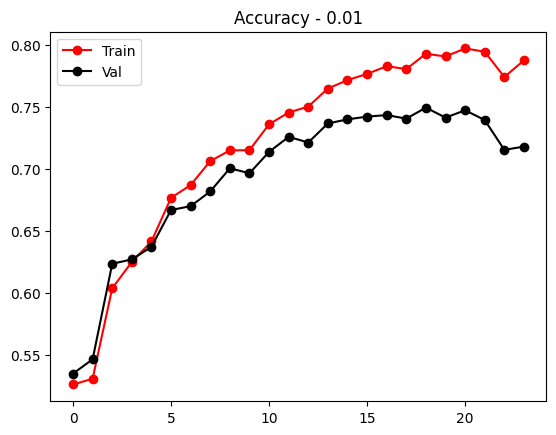

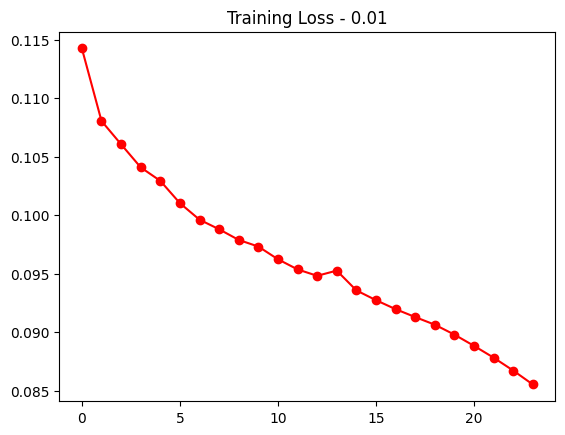

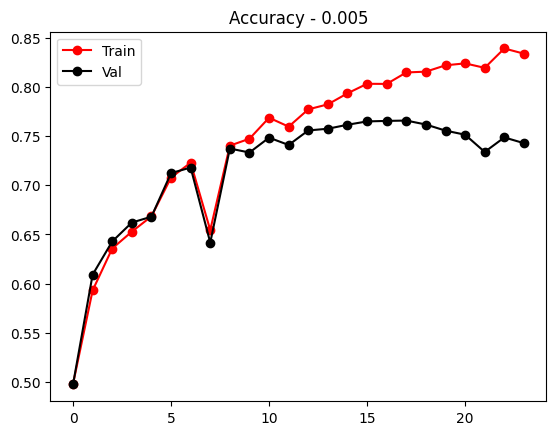

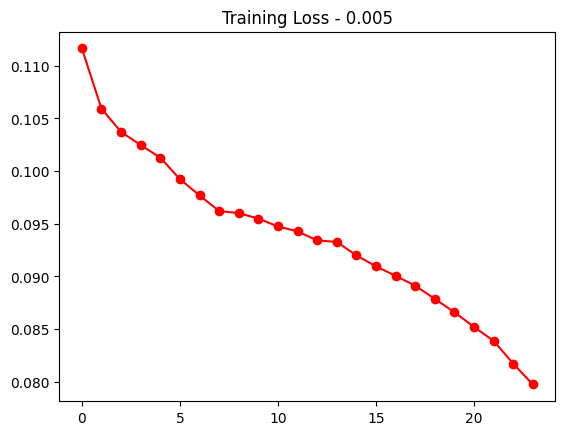

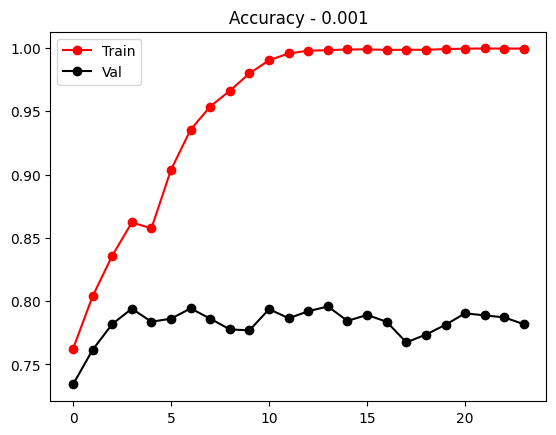

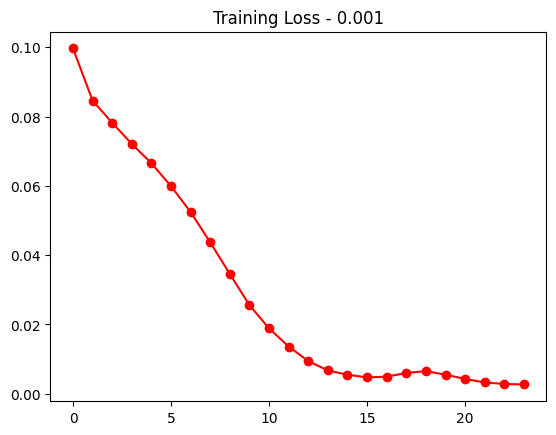

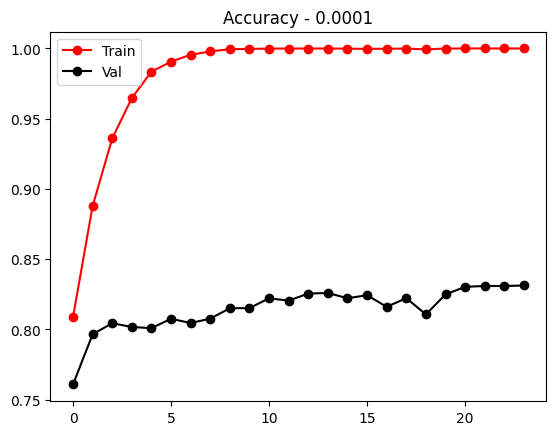

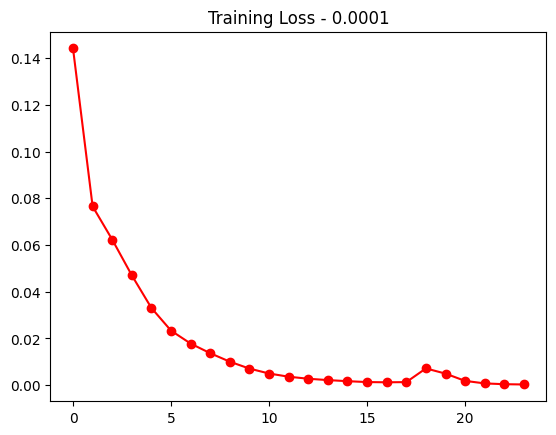

In [36]:
total_start = time.time()

train_loss_list = []
train_accuracy_list = []
val_accuracy_list = []
best_accuracy2 = 0.5
best_resnet18_finetune_list= []

for learn_rate in [0.01, 0.005, 0.001, 0.0001]:
    total_start = time.time()
    resnet18_default_weights = torchvision.models.ResNet18_Weights.DEFAULT
    resnet18_pretrain = torchvision.models.resnet18(weights=resnet18_default_weights, progress=False)
    resnet18_finetune = resnet18_pretrain
    num_ftrs = resnet18_finetune.fc.in_features
    resnet18_finetune.fc = torch.nn.Linear(num_ftrs, len(unique_traits))
    resnet18_finetune = resnet18_finetune.cuda()

    train_loss_list = []
    train_accuracy_list = []
    val_accuracy_list = []
    best_accuracy2 = 0.5
    best_resnet18_finetune_list= []

    optim2 = torch.optim.Adam(resnet18_finetune.parameters(),lr = learn_rate)
    epochs = 24
    print(f"\n{epochs} epochs at Learning Rate =", learn_rate,"\n\n")
    for epoch in range(epochs):
        epoch_start = time.time()
        running_loss = 0.0
        resnet18_finetune.train()
        for imgs, labels in train_loader:
            imgs = imgs.cuda()
            labels = labels.cuda()
            optim2.zero_grad()
            with torch.set_grad_enabled(True):
                outputs = resnet18_finetune(imgs)
                loss = multi_label_loss(outputs,labels)
                loss.backward()
                optim2.step()
            running_loss += (loss.item()*imgs.size(0))
        curr_ep_loss2 = running_loss/len(train_loader.dataset)
        curr_train_aucs = get_score_model_auroc(resnet18_finetune, train_loader)
        curr_train_accuracy2 = average_auc(curr_train_aucs)
        curr_val_aucs = get_score_model_auroc(resnet18_finetune, val_loader)
        curr_val_accuracy2 = average_auc(curr_val_aucs)
        print('Ep {:d}: Train Loss = {:.5f}; Train Acc = {:.5f}'.format(epoch,curr_ep_loss2,curr_train_accuracy2))
        print('Val Acc = {:.5f}'.format(curr_val_accuracy2))
        train_loss_list.append(curr_ep_loss2)
        train_accuracy_list.append(curr_train_accuracy2)
        val_accuracy_list.append(curr_val_accuracy2)

        if curr_val_accuracy2 > best_accuracy2:
                best_accuracy2 = curr_val_accuracy2
                best_resnet18_finetune_list.append(copy.deepcopy(resnet18_finetune))
                best_resnet18_finetune = best_resnet18_finetune_list[-1]
                torch.save(best_resnet18_finetune,f'./best_resnet18_finetune_{learn_rate}.pt')
        epoch_time = time.time()-epoch_start
        print('Epoch {:d} - time {:.1f}'.format(epoch,epoch_time))

    best_resnet18_finetune = best_resnet18_finetune_list[-1]
    total_time = time.time()-total_start
    print('total training time {:.1f}'.format(total_time))

    plt.figure()
    plt.plot(train_accuracy_list,'ro-',val_accuracy_list,'ko-')
    plt.legend(['Train','Val'])
    plt.title(f'Accuracy - {learn_rate}')

    plt.figure()
    plt.plot(train_loss_list,'ro-')
    plt.title(f'Training Loss - {learn_rate}')

In [37]:
top_model = torch.load('./best_resnet18_finetune1.pt')
test_results = get_score_model_auroc(top_model, test_loader)

real_results = 0
total_auc = 0
for k, trait in enumerate(test_dataset.get_labels_name()):
    if not np.isnan(test_results[k]):
        print(f"{trait} - total samples: {traits_dict[trait]} - {round(test_results[k],4)}")
        real_results += 1
        total_auc += test_results[k]
print(f"average auc ({real_results} traits): {total_auc/real_results}")

Calico - total samples: 163 - 0.4334
Axanthic (VPI) - total samples: 353 - 0.4419
Enchi - total samples: 1264 - 0.4368
100% Het Puzzle - total samples: 64 - 0.5649
100% Het Genetic Stripe - total samples: 88 - 0.5967
Super Fire - total samples: 110 - 0.4784
Mahogany - total samples: 277 - 0.4823
Super Orange Dream - total samples: 26 - 0.4451
Trick - total samples: 34 - 0.6376
Mystic - total samples: 73 - 0.4965
100% Het Axanthic (TSK) - total samples: 266 - 0.4186
Spider - total samples: 650 - 0.6551
Super Yellow Belly - total samples: 54 - 0.3832
Phantom - total samples: 72 - 0.6006
Orange Dream - total samples: 566 - 0.4481
Wookie - total samples: 42 - 0.6491
Blade - total samples: 46 - 0.4214
Pos Het Albino - total samples: 21 - 0.6566
Genetic Stripe - total samples: 90 - 0.3905
Spotnose - total samples: 279 - 0.5642
Lavender Albino - total samples: 64 - 0.7431
Black Pastel - total samples: 751 - 0.4747
Female Maker - total samples: 27 - 0.6561
Vanilla - total samples: 217 - 0.514


In [38]:
total_start = time.time()

train_loss_list = []
train_accuracy_list = []
val_accuracy_list = []
best_accuracy2 = 0.5
best_resnet50_finetune_list= []

for learn_rate in [0.01, 0.005, 0.001, 0.0001]:
    total_start = time.time()
    resnet50_default_weights = torchvision.models.ResNet50_Weights.DEFAULT
    resnet50_pretrain = torchvision.models.resnet50(weights=resnet50_default_weights, progress=False)
    resnet50_finetune = resnet50_pretrain
    num_ftrs = resnet50_finetune.fc.in_features
    resnet50_finetune.fc = torch.nn.Linear(num_ftrs, len(unique_traits))
    resnet50_finetune = resnet50_finetune.cuda()

    train_loss_list = []
    train_accuracy_list = []
    val_accuracy_list = []
    best_accuracy2 = 0.5
    best_resnet50_finetune_list= []

    optim2 = torch.optim.Adam(resnet50_finetune.parameters(),lr = learn_rate)
    epochs = 28
    print(f"\n{epochs} epochs at Learning Rate =", learn_rate,"\n\n")
    for epoch in range(epochs):
        epoch_start = time.time()
        running_loss = 0.0
        resnet50_finetune.train()
        for imgs, labels in train_loader:
            imgs = imgs.cuda()
            labels = labels.cuda()
            optim2.zero_grad()
            with torch.set_grad_enabled(True):
                outputs = resnet50_finetune(imgs)
                loss = multi_label_loss(outputs,labels)
                loss.backward()
                optim2.step()
            running_loss += (loss.item()*imgs.size(0))
        curr_ep_loss2 = running_loss/len(train_loader.dataset)
        curr_train_aucs = get_score_model_auroc(resnet50_finetune, train_loader)
        curr_train_accuracy2 = average_auc(curr_train_aucs)
        curr_val_aucs = get_score_model_auroc(resnet50_finetune, val_loader)
        curr_val_accuracy2 = average_auc(curr_val_aucs)
        print('Ep {:d}: Train Loss = {:.5f}; Train Acc = {:.5f}'.format(epoch,curr_ep_loss2,curr_train_accuracy2))
        print('Val Acc = {:.5f}'.format(curr_val_accuracy2))
        train_loss_list.append(curr_ep_loss2)
        train_accuracy_list.append(curr_train_accuracy2)
        val_accuracy_list.append(curr_val_accuracy2)

        if curr_val_accuracy2 > best_accuracy2:
                best_accuracy2 = curr_val_accuracy2
                best_resnet50_finetune_list.append(copy.deepcopy(resnet50_finetune))
                best_resnet50_finetune = best_resnet50_finetune_list[-1]
                torch.save(best_resnet50_finetune,f'./best_resnet50_finetune_{learn_rate}.pt')
        epoch_time = time.time()-epoch_start
        print('Epoch {:d} - time {:.1f}'.format(epoch,epoch_time))

    best_resnet50_finetune = best_resnet50_finetune_list[-1]
    total_time = time.time()-total_start
    print('total training time {:.1f}'.format(total_time))

    plt.figure()
    plt.plot(train_accuracy_list,'ro-',val_accuracy_list,'ko-')
    plt.legend(['Train','Val'])
    plt.title(f'Accuracy - {learn_rate}')

    plt.figure()
    plt.plot(train_loss_list,'ro-')
    plt.title(f'Training Loss - {learn_rate}')

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /home/jordan/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
